2023.04.16

# **計畫四：月營收金額預測 - DNN/CNN/Transformer regression**

以前 48 個月的月營收金額預測第 t 期的月營收金額。

<br>

||訓練資料X|訓練資料y|測試資料X|測試資料y|
|---|---|---|---|---|
|Start|2015-01 - 2018-12|2019-01|2016-01 - 2019-12|**2020-01**|
|End|2015-12 - 2019-11|2019-12|2016-12 - 2020-11|**2020-12**|

<br>

執行環境：Google Colab


---


### **目錄**

1. 讀取資料集
2. 取得訓練和測試資料
3. 訓練模型

4. 預測並衡量結果
  * Functions
  * 預測年月設定
  * Random Forest
  * XGB

5. 畫圖
  * Functions
  * 預測金額
  * 預測分數
  * 變數重要性

6. 最好和最差模型
  * Classes
  * Random Forest 和 XGB 各自預測最好和最差的月份


防止 Colab 自動斷開


```
function ConnectButton(){
    console.log("Connect pushed"); 
    document.querySelector("#connect").click() 
}
setInterval(ConnectButton,60000);

```



## **0. Setup**

In [ ]:
# install packages if needed
!pip install --upgrade pip
!pip install tensorflow dalex optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# run this cell if you leverage the colab envrionment
# Connect to the Google Drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import time
from tqdm.auto import tqdm

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

warnings.filterwarnings("ignore")

### **Project Path (記得更改路徑)**

In [ ]:
project_path = '/content/gdrive/MyDrive/Colab Notebooks/MLAcc/HW4/HW4'

## **1. 讀取資料集**

【**月營收盈餘 (2013-2022)**】

資料期間：2013年1月至2022年12月（共120個月）

資料範圍：上市、櫃公司（排除金融業、生技醫療、建材營造、DR和KY公司）

資料來源：TEJ Company DB、公開資訊觀測站


In [ ]:
org_data = pd.read_excel(os.path.join(project_path, '201301-202212_listed_nonfin.xlsx'), index_col=0)
# org_data = pd.read_excel('201301-202212_listed_nonfin.xlsx', index_col=0)
org_data.columns = pd.to_datetime(org_data.columns).to_period('M')
org_data

,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,...,2022-03,2022-04,2022-05,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12
公司,,,,,,,,,,,,,,,,,,,,,
1101 台泥,9134465,5540346,9457971,9919269,9543782,9517630,9875888,9835143,10060975,10654077,...,9971650,8319342,7733787,9145989,10102468,10689860,10404901,11368096,9674576,12584154
1102 亞泥,6018213,2552357,5428755,5930748,6239676,5952754,5942364,5786107,5879394,6478670,...,8160414,8710220,8000427,7776413,7864622,7069221,6994078,7601097,8306062,8340507
1103 嘉泥,288455,166638,286007,365292,382601,302995,294781,336088,314563,429783,...,220463,168089,163521,183177,178825,182371,205264,209429,221763,228644
1104 環泥,486481,299860,461732,394631,406677,415968,453397,393203,448691,521445,...,591593,638493,537082,573028,580420,605512,597159,634981,631827,725055
1108 幸福,481802,276936,444917,362054,381384,368109,439572,379115,387362,450770,...,345612,335518,332258,334113,326691,390053,346635,401202,383773,418326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9951 皇田,201785,167967,240746,243935,238296,193880,198427,256724,228796,250756,...,374229,302262,323433,371791,337581,468608,464373,432835,500111,506796
9955 佳龍,394489,383183,428478,564053,336622,295391,434605,306534,266617,363766,...,96200,101850,95096,80726,85625,81881,79179,80630,91270,84115
9958 世紀鋼,198944,166364,351222,280864,289332,426371,213281,302589,401695,255738,...,626104,401960,673479,665459,651699,757968,903198,911834,944060,1082675


In [ ]:
print("Data shape:", org_data.shape)
print("Data size:", org_data.size)

Data shape: (1240, 120)
Data size: 148800


## **2. 取得訓練和測試資料**


In [ ]:
# 往前推算月份
def back_month(yr: int, mon: int, back: int):
    '''
    往前推算月份。

    Parameters
    ----------
    yr: 第t期的年, mon: 第t期的月, back: 往前推算幾個月
    '''

    # 若當下月份(mon)減除往前期數(b)大於0，即還在同一年內
    if mon - back > 0:                         
        return str(yr) + '-' + str(mon - back)      # 直接回傳當下年份(yr)，以及當下月份(mon)減除往前期數(back)，所組成的字串
    # 不屬於同一年
    else:                               
        return back_month(yr - 1, mon, back - 12)   # 手動調減一年，並將往前期數(back)減少12個月

In [ ]:
# 取得 t-back_most ~ t-1 期的 X 資料
def X_months(data: pd.DataFrame, y_yr: int, y_mon: int, back_most: int):
    '''
    取得 t-back_most ~ t-1 期的 X 資料。

    Parameters
    ----------
    data: 資料集; y_yr: 第t期的年, y_mon: 第t期的月, back_most: X的最早月份是第t期的往前多少月份
    '''

    months = []
    for b in range(back_most, 0, -1):               # 從 back_most 到 1
        months.append(back_month(y_yr, y_mon, b))   # 根據每個往前月份數(b)推算對應年月，儲存進 months 之中
    
    # 回傳 data 中的這些月份
    return data[months]

In [ ]:
from datetime import datetime

# 取得起始年月到終止年月的每個年月
def month_range(y_start_yr: int, y_start_mon: int, y_end_yr: int, y_end_mon: int):
    '''
    取得起始年月到終止年月的每個年月。

    Parameters
    ----------
    y_start_yr: 起始年, y_start_mon: 起始月, y_end_yr: 終止年, y_end_mon: 終止月
    '''

    start_ym = str(y_start_yr) + '-' + str(y_start_mon)
    
    # pd.date_range 中的 end 為終止月的下一個月，因此須將終止年月加 1 個月
    if y_end_mon < 12:
        end_ym = str(y_end_yr) + '-' + str(y_end_mon + 1)   # 終止月為1-11月時，直接在月份+1
    else: 
        end_ym = str(y_end_yr + 1) + '-' + '1'              # 終止月為12月時，end 設為下一年的1月
    
    # 生成從起始年月到終止年月的每個年月
    month_list = pd.date_range(start=start_ym, end=end_ym, freq='M').to_period('M').strftime('%Y-%m').to_numpy()

    return month_list

In [ ]:
# 對 X 做標準化（和 sklearn 的 StandardScaler 公式相同）
def standardize_X(data: pd.DataFrame):
    '''
    對 X 做標準化。

    Parameters 
    ----------
    data: X

    Returns
    ----------
    mean, std, std_data
    '''
    mean = data.mean(axis=1)
    std = data.std(axis=1)
    std_data = data.apply(lambda row: (row-mean[row.name])/std[row.name], axis=1)
    return mean, std, std_data

# 以 X 的平均數和標準差對 y 做標準化
def standardize_y(mean: pd.Series, std: pd.Series, data: pd.Series):
    '''
    以 X 的平均數和標準差對 y 做標準化。

    Parameters
    ----------
    mean: X 的平均數, std: X 的標準差, data: y
    
    Returns
    ----------
    std_data
    '''
    std_data = []
    for i in range(len(data)):
        std_data.append((data[i]-mean[i])/std[i])
    return std_data

# 將標準化的 y 轉回正常值
def standardized_y_back(mean: pd.Series, std: pd.Series, std_data: np.array):
    '''
    將標準化的 y 轉回原始值。

    Parameters 
    ----------
    mean: X 的平均數, std: X 的標準差, data: 標準化的 y

    Returns
    ----------
    data
    '''
    data = []
    for i in range(len(std_data)):
        data.append(std_data[i] * std[i] + mean[i])
    return data

In [ ]:
# 取得訓練和測試資料集
def get_train_test(data: pd.DataFrame, y_test_yr: int, y_test_mon: int, back_most: int, y_back: int):
    '''
    取得訓練和測試資料集。

    Parameters
    ----------
    data: 資料集, y_test_yr: 要預測的年, y_test_mon: 要預測的月, 
    back_most: X的最早月份是第t期的往前多少月份, 
    y_back: 訓練資料集的y要比測試資料集的y往前多少月份

    Returns 
    ----------
    X_train, y_train, X_test, y_test
    '''

    # 測試資料
    y_test = data[f'{y_test_yr}-{y_test_mon}']
    X_test = X_months(data, y_test_yr, y_test_mon, back_most)
    # 訓練資料
    y_train_ym = back_month(y_test_yr, y_test_mon, y_back)
    y_train = data[y_train_ym]
    X_train = X_months(data, int(y_train_ym.split("-")[0]), int(y_train_ym.split("-")[1]), back_most)
    # 更改X的變數名稱為 t-? 期
    X_test.columns = ["t-"+str(t) for t in range(back_most, 0, -1)]                                     
    X_train.columns = ["t-"+str(t) for t in range(back_most, 0, -1)]     

    return X_train, y_train, X_test, y_test

## **3. 訓練模型**

In [ ]:
# module for deep learning 
import tensorflow as tf
tf.random.set_seed(2023) # fix random seed
# keras is the submodule of tensorflow, which is beginner-friendly for particitioner
from tensorflow import keras
from keras.backend import clear_session
# dalex is for explaining the variable importance of deep learning model
import dalex as dx
# optuna is a module for tuning hyperparametes
# import optuna

TensorBoard 是 tensorflow 中一款可以協助我們判斷模型學習成效的套件，jupyter notebook 有提供他的 magic 指令，讓我們可以很方便的在這個環境中使用這個好用的擴充功能，在這裡我們先啟動他

In [ ]:
%load_ext tensorboard

### Keras 模型
Keras 是一個容易上手的深度學習框架，使用的邏輯是用一層一層規定輸出長相的函數，讓套件自己把把模型各層的輸入輸出接上，就可以實現各種不同的深度模型。Keras 有很多不同的呼叫方法，下面我們示範清楚地把輸入輸出寫出來的 Functional API 模式，以下面的 `make_dnn_model` 為例：  
第一層永遠是 `keras.layers.Input`，在這一層裡先定義好 input 的形狀，以過去48個月預測未來一個月的資料為例，要輸入模型的「X」的「形狀」是(48, 1)，因為總共會有48組數值，每一組數值裡面只有1個數字。我們把呼叫的結果存到 `inputs` 這個變數。  
第二層開始就是模型的部分，這裡怎麼設計的彈性很大，我們先以一個 48 個 neuron 的神經網路開始嘗試。呼叫 `keras.layers.Dense(48)` 會回傳給一個 output 出 48 個數值的一層神經網路，他的資料型態是函數。接著，就可以把上一層的模型輸出的結果`x`當成這個函數的輸入，再把輸出的結果在存到`x`這個變數。  
在得到輸出之後，神經網路的一個重要設計就是加上 activation function 。以常用的 ReLU 為例，在 keras 裡面我們可以很簡單透過呼叫 `keras.layers.ReLU()` 達到，同樣地，我們可以把上一層的輸出結果`x`再放入這個函數。  
這樣簡單就完成了一層模型。如果後續要加深模型、或更改模型長相，也可以透過這個方法達到。這裡初步嘗試一個兩層、每層都有 48 個 neuron 的深度模型。  
最後，由於我們要預測的 y 只有一個數值，所以在最後需要再加一個 layer 把 48 個數值輸出成 1 個數值。這裡可以透過 `keras.layers.Dense(1)` 達成。把最後的結果用變數`output_layer`存下來。
最後，利用 `keras.models.Model` 告訴 python 我們的模型是輸入跟輸出分別是什麼，他會透過紀錄變數的傳導直接幫我們建立一個模型，這個模型就可以被用來訓練。

In [ ]:
def make_dnn_model(input_shape):
    '''
    input_shape: int, should equal to feature period
    '''
    # input layer
    input_layer = keras.layers.Input((input_shape,))
    
    # model first layer
    x = keras.layers.Dense(input_shape)(input_layer)
    # equal to:
    # dense_layer = keras.layers.Dense(input_shape)
    # x = dense_layer(x)
    x = keras.layers.ReLU()(x)
    
    # model second layer
    x = keras.layers.Dense(input_shape)(x)
    dense_out = keras.layers.ReLU()(x)
    
    # model output layer
    output_layer = keras.layers.Dense(1)(dense_out)
        
    # tell python what are the model's input and output
    return keras.models.Model(inputs=input_layer, outputs=output_layer)

在利用函數建立完模型之後，把他實例化就可以用來訓練模型了。在這裏，keras 有兩個 method 一定要呼叫：
1. `.compile()`: 設定跟模型訓練相關的細節，其中比較重要的包含：
    1. `optimizer=`: 用來設置最佳化損失函數的時候使用的演算法。這裡使用 Adam，也有很多其他方法可供選擇，參考：https://keras.io/api/optimizers/
    2. `loss=`: 損失函數，也就是模型要最佳化的目標。這裡由於是回歸任務，選擇 MSE
    3. `metrics=`: 用來衡量模型表現的指標，選擇 MAE  
    另外可以注意到，由於 loss 跟 metric 都可以有不只一個，因此傳入的是一個長度為1的 list ，可以根據自己的需要增加其他 loss。
    
    經過 `.compile()` 之後的模型就可以透過呼叫下一步的 `.fit()` 來訓練。
2. `.fit()`: 實際上開始訓練模型，我們會在這裡告訴 python 要用哪些資料、超參數來訓練。其中除了資料之外，幾個比較重要的超參數是：
    1. `epochs=`: 告訴模型總共要在這些跑過整份資料幾次
    2. `batch_size=`: 告訴模型每次針對損失函數計算梯度的時候要用多少樣本，大小受電腦的記憶體大小限制
    3. `callbacks=`: 在訓練的時候要採用哪些小工具來協助訓練，例如：
        1. model checkpoint: 協助我們處理模型儲存的位置
        2. early stopping: 可以設定模型在 validation set 上面多久沒進步的時候要停止訓練
        3. tensorboard: 協助我們使用 tensorboard  
    `.fit()` 會回傳模型訓練的過程資料，統稱為 history ，因此我們用一個變數把這個結果存下來。
    
除了上述兩個 method 之外，我們還可以透過 `.evaluate()` 來評估已經訓練完的模型， `.predict()` 來透過訓練好的模型預測真實資料
    

In [ ]:
NUM_FEATURES = 48 
EARLY_STOPPING_STEPS = 30
BATCH_SIZE = 1024
EPOCHS = 2000
LEARNING_RATE = 0.005

def evaluate_keras_model(
    name, 
    model_fn, 
    learning_rate,
    X_train,
    y_train,
    X_valid,
    y_valid
):
    
    # X_train, y_train = X_train.to_numpy(), np.array(y_train)
    # X_valid, y_valid = X_valid.to_numpy(), np.array(y_valid)
    # path for saving logs in order to work with tensorboard, use timestamp to distinguish different trial
    logdir = os.path.join("logs", name, datetime.now().strftime("%Y%m%d-%H%M%S"))
    callbacks = [
        keras.callbacks.ModelCheckpoint(
            f"{name}.h5", save_best_only=True, monitor="val_loss"
        ),
        keras.callbacks.EarlyStopping(
            monitor="val_loss", 
            patience=EARLY_STOPPING_STEPS, 
            verbose=0
        ),
        keras.callbacks.TensorBoard(logdir, histogram_freq=1)
    ]
    optimizer = keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    losses = [keras.losses.MeanSquaredError()]
    metrics = [keras.metrics.MeanAbsoluteError()]
    
    model = model_fn(NUM_FEATURES)
    model.compile(
        optimizer=optimizer,
        loss=losses,
        metrics=metrics,
    )
    
    history = model.fit(
        X_train,
        y_train,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=callbacks,
        # determine validation set
        validation_data=(
            X_valid, 
            y_valid
        ),
        # show information in the training process
        verbose=0,
        # speed up settings
        workers=-1,
        use_multiprocessing=True
    )
    
    # reload the best model saved by ModelCheckpoint callback
    model = keras.models.load_model(f"{name}.h5")
        
    return history, model

有了這個函數，我們就可以利用它來重複跑實驗。在進行訓練之前，我們先啟動用來追蹤訓練成效的 tensorboard ，在訓練過程中，可以透過右上方的更新按鈕來取得模型現在訓練的狀態

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.xlabel('Epoch')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)

觀察完模型的收斂狀態之後，可以利用 Dalex 中的 Explainer 來看一下模型各個變數的在樣本上的平均貢獻程度。由於樣本數量會影響到計算速度，而我們不需要用到全部的資料即可估計變數，因此取樣一部分的資料來計算 variable importance 即可。 原理是在抽樣資料上，透過輪流排除掉每一個變數來檢測他對模型準度的影響，來評估該變數的重要性。
這裡我們是利用訓練資料來查看整體（global）模型的狀況，也可以透過 `.predict_parts()` 的功能來看影響單一資料的結果（local）。

長條圖的意義詮釋可以參考 dalex 文件的官方教科書：https://ema.drwhy.ai/featureImportance.html#featureImportanceMethod

或是這一篇文章前半部（Kernel Shap 以前）的說明：https://medium.com/ai-academy-taiwan/%E5%8F%AF%E8%A7%A3%E9%87%8B-ai-xai-%E7%B3%BB%E5%88%97-shap-2c600b4bdc9e  

In [ ]:
def show_dalex(model, X_train, y_train):
    explainer = dx.Explainer(
        model, 
        X_train,
        y_train,
        label='revenue',
        verbose=False # disable progress bar
    )
    feature_importance = explainer.model_parts(N=500)
    return feature_importance.result.drop('label', axis=1).set_index('variable')

熟悉這個流程之後，後續我們只要專注在設計不同的模型結構，就可以反覆利用前面的函數來跑各種實驗，下面分別是 CNN 跟 transformer 。
觀察程式碼的邏輯可以發現，我們都是把同樣的區塊重複，達到加深模型的目的。
同時，我們也可以透過上面的 tensorboard 來持續的追蹤不同模型的表現。

首先是 CNN 的部分，這裡我們考慮的是一個三層的 CNN 模型，每一層的結構都是一樣，output 出深度為 64 的 feature map，並利用 padding 機制使得 kernel 掃出來的序列長度維持不變。這裡體現了 keras 套件的方便之處，我們不用手動計算每一層 input 的形狀來設定模型。由於參數較多，我們加入 batch normalization 的機制來幫助學習。  
![image.png](attachment:c9da932f-3ead-4f00-aafb-34d00a57f580.png)!  
圖片來源：https://www.researchgate.net/figure/One-dimensional-convolutional-neural-network-1D-CNN-architecture-for-the-timeseries_fig2_348502722
參考資料：https://medium.com/ching-i/batch-normalization-%E4%BB%8B%E7%B4%B9-135a24928f12

In [ ]:
def make_cnn_model(input_shape):
    '''
    input_shape: int, should equal to feature period
    ref: https://keras.io/examples/timeseries/timeseries_classification_from_scratch/
    paper: https://arxiv.org/pdf/1611.06455.pdf
    '''
    input_layer = keras.layers.Input((input_shape, 1))
    # not panel data, so the input is only 1-dimension every timestamp
    
    conv1 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(input_layer)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.ReLU()(conv1)

    conv2 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.ReLU()(conv2)

    conv3 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.ReLU()(conv3)
    
    # pooling: reduce the output
    gap = keras.layers.GlobalAveragePooling1D()(conv3)
    
    output_layer = keras.layers.Dense(1)(gap)
        
    return keras.models.Model(inputs=input_layer, outputs=output_layer)

接著是 transformer 的部分，transformer 是由多個 block 堆積而成，每一個 block 裡面的結構都是 multi-head attention 加上把結果用 CNN 掃出來，再接到下一個 block。由於模型結構較大，在裡面加入了 layer normalization 、 Dropout 和 residual connection 的機制。

In [ ]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = keras.layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = keras.layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = keras.layers.LayerNormalization(epsilon=1e-6)(res)
    x = keras.layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = keras.layers.Dropout(dropout)(x)
    x = keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res # residual connection

def make_transformer_model(
    input_shape,
    head_size=48, # dimension of each vector for each input
    num_heads=2, # number of heads
    ff_dim=2, # number of feature map in the convolution
    num_transformer_blocks=2,
    mlp_units=[64], # Dense network after transformer blocks
    dropout=0.2, # regularization terms
    mlp_dropout=0.2, # regularization terms
):
    inputs = keras.Input(shape=(input_shape, 1))
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = keras.layers.Dense(dim, activation="relu")(x)
        x = keras.layers.Dropout(mlp_dropout)(x)
    
    outputs = keras.layers.Dense(1)(x)
        
    return keras.Model(inputs, outputs)

## **4. 預測並衡量結果**

衡量指標：

*   RMSE (Root Mean Square Error)

  $RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^n(\hat{y}_i - y_i)^2}$

<br>

*   MAE (Mean Absolute Error)

  $MAE = \frac{1}{n}\sum_{i=1}^n|\hat{y}_i - y_i|$

### **4.0 Functions**

In [ ]:
# 評估預測結果好壞
def evaluatePerformance(y_true, y_pred, rmse: list, mae: list):
    '''
    評估預測結果好壞。

    Parameters
    ----------
    y_true: 真實月營收, y_pred: 預測月營收, 
    rmse, mae: 用來儲存各種衡量指標預測分數的 list
    ''' 
    rmse.append(round(mean_squared_error(y_true, y_pred, squared=False), 0))
    mae.append(round(mean_absolute_error(y_true, y_pred), 0))

# 彙整不同衡量指標的預測分數 
def savePerformace(scoresD, rmse: list, mae: list, dataName: str):  
    '''
    彙整不同衡量指標的預測分數。

    Parameters
    ----------
    scoresD: 彙整所有分數的 dataframe, 
    rmse, mae: 各種衡量指標的預測分數,
    dataName: | 'org' | 'def' |
    ''' 
    scoresD[f'RMSE-{dataName}'] = rmse
    scoresD[f'MAE-{dataName}'] = mae

In [ ]:
import gc
# 預測並儲存結果
def predictMonthlyRevenue(
    data: pd.DataFrame, 
    y_test_start_yr: int, 
    y_test_start_mon: int, 
    y_test_end_yr: int, 
    y_test_end_mon: int, 
    modelName: str,
    model_fn,
    learning_rate,
):
    '''
    預測月營收。
    
    Parameters
    ----------    
    data: 資料集, 
    y_test_start_yr: 預測起始年, y_test_start_mon: 預測起始月, 
    y_test_end_yr: 預測終止年, y_test_end_mon: 預測終止月, 
    modelName: | 'rf' | 'xgb' |, 

    Returns
    ----------    
    pred = 
    {"org": org_pred,
     "def": def_pred
    },
    
    feature_importance = 
    {"org": feature_importance,
     "def": feature_importance_def
    },

    scores
    '''

    start = time.time()
    test_y_m = month_range(y_test_start_yr, y_test_start_mon, y_test_end_yr, y_test_end_mon)  # 所有要預測的年月
    back_most = 48    # 以前48個月的資料預測第t期

    org_pred = pd.DataFrame(index=data.index.tolist())          # 紀錄原始資料的預測值
    feature_importance = pd.DataFrame()                         # 紀錄模型所計算出的 feature importance
    
    def_pred = pd.DataFrame(index=data.index.tolist())          # 紀錄平減資料的預測值
    feature_importance_def = pd.DataFrame()                     # 紀錄模型所計算出的 feature importance

    # 紀錄原始資料的預測分數
    rmse_list = []
    mae_list = []

    # 紀錄平減資料的預測分數
    rmse_list_def = []
    mae_list_def = []

    # 彙整所有預測分數
    scores = pd.DataFrame(index=test_y_m)

    # 針對每個欲預測的年月
    for i in tqdm(test_y_m):

        y_test_yr = int(i.split("-")[0])    # 預測的年
        y_test_mon = int(i.split("-")[1])   # 預測的月

        #-----------------------取得訓練和測試資料集-----------------------
        # 原始資料
        X_train, y_train, X_test, y_test = get_train_test(data, y_test_yr, y_test_mon, back_most, y_back=12)    # y_train 為 y_test 往前推 12 個月

        # 平減資料（標準化資料）
        mean_test, std_test, X_test_def = standardize_X(X_test)
        mean_train, std_train, X_train_def = standardize_X(X_train)
        y_train_def = pd.DataFrame(standardize_y(mean_train, std_train, y_train))
        y_test_def = pd.DataFrame(standardize_y(mean_test, std_test, y_test))
        
        
        #-----------------------模型訓練-----------------------
        history, model = evaluate_keras_model(
            modelName, model_fn, learning_rate, 
            X_train, y_train, X_test, y_test
        )
        def_history, def_model = evaluate_keras_model(
            modelName, model_fn, learning_rate,
            X_train_def, y_train_def, X_test_def, y_test_def
        )
 
        #-----------------------儲存預測值-----------------------
        org_pred[i] = np.round(model.predict(X_test), 0)
        def_pred[i] = np.round(standardized_y_back(mean_test, std_test, def_model.predict(X_test_def)), 0)   # 將標準化的預測值轉換回原始值
        
        #-----------------------儲存變數重要性-----------------------
        model_feature_importance = show_dalex(model, X_train, y_train)
        model_feature_importance_def = show_dalex(def_model, X_train_def, y_train_def)
        feature_importance[i] = np.round(model_feature_importance, 4)
        feature_importance_def[i] = np.round(model_feature_importance_def, 4)
        
        #-----------------------儲存預測分數-----------------------
        evaluatePerformance(y_test, org_pred[i], rmse_list, mae_list)
        evaluatePerformance(y_test, def_pred[i], rmse_list_def, mae_list_def)
        
    # Set feature names
    # feature_importance.index = model.feature_names_in_
    # feature_importance_def.index = def_model.feature_names_in_    
    

    # 彙整不同衡量指標的預測分數
    savePerformace(scores, rmse_list, mae_list, 'org')
    savePerformace(scores, rmse_list_def, mae_list_def, 'def')
    
    # 將所有預測結果、變數重要性分別存在 dictionary 中
    pred = {
        "org": org_pred,
        "def": def_pred
    }

    feature_importance = {
        "org": feature_importance,
        "def": feature_importance_def
    }

    print("Using time:", "%.3f"%(time.time() - start), " secs.")
    gc.collect()
    return pred, feature_importance, scores


# 第一部分：比較不同模型在不同時段的預測結果
使用 DNN/CNN/Transformer 預測 2020/1 ~ 2020/12 （共 12 個月）的月營收，並與 2018/1 ~ 2018/12 的做比較，並詳述如何設定實驗、其中你的考量分別是什麼，例如：要不要平減、特徵長度選擇、訓練資料範圍選擇。此外，請：
1. 以折線圖呈現預期金額和各模型的預測金額
2. 分析預測結果，如討論各個模型分數差異、預測月營收的型態、最佳與最差模型（圖表請府以文字簡單說明結果）。
3. 與範例中 2018/1 ~ 2018/12 的預測結果做比較，並與 Random Forest 和 XGBoost Regression 做比較。  
注意：請盡量多探索不同設定（如：資料是否平減、不同模型結構、超參數設定等）、分析不同面向（如：運算時間、模型大小、overfitting 風險等），並輔以財務專業知識推測可能的原因（如：預測特別不準的地方可能發生了什麼事件）。呈現時請盡量選擇組織化的敘述方式，方便理解你想傳遞的結果。  
此外，深度模型的訓練超參數對表現影響頗大，如果模型訓練不理想，請多嘗試調整超參數甚至是模型結構。
    

### **4.1 預測年月設定**


||訓練資料X|訓練資料y|測試資料X|測試資料y|
|---|---|---|---|---|
|Start|2015-01 - 2018-12|2019-01|2016-01 - 2019-12|**2020-01**|
|End|2015-12 - 2019-11|2019-12|2016-12 - 2020-11|**2020-12**|


In [ ]:
start_y = 2020
start_m = 1
end_y = 2020
end_m = 12

### **4.2 DNN**
考量到訓練時間，這裡我們先不對各個 model 做 cross validation hyperparameter tuning

In [ ]:
# # 訓練與預測 (12 min.)
# import gc

# pred_dnn, feature_importance_dnn, scores_dnn = predictMonthlyRevenue(
#     org_data, start_y, start_m, end_y, end_m, 'dnn', make_dnn_model, 1e-4
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_dnn = os.path.join(project_path, 'pred_dnn.pkl')
# with open(file_path_pred_dnn, 'wb') as f:
#     pickle.dump(pred_dnn, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_dnn = os.path.join(project_path, 'feature_importance_dnn.pkl')
# with open(file_path_feature_importance_dnn, 'wb') as f:
#     pickle.dump(feature_importance_dnn, f)

# # Write the dictionary to a file_scores
# file_path_scores_dnn = os.path.join(project_path, 'scores_dnn.pkl')
# with open(file_path_scores_dnn, 'wb') as f:
#     pickle.dump(scores_dnn, f)

In [ ]:
# # 原始資料的預測金額
# pred_dnn['org'].head(4)

In [ ]:
# # 平減資料的預測金額
# pred_dnn['def'].head(4)

In [ ]:
# # 預測分數
# scores_dnn.head(4)

In [ ]:
# # 下載 2020 DNN logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

### **4.3 CNN**

In [ ]:
# pred_cnn, feature_importance_cnn, scores_cnn = predictMonthlyRevenue(
#     org_data, start_y, start_m, end_y, end_m, 'cnn', make_cnn_model, 5e-2
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_cnn = os.path.join(project_path, 'pred_cnn.pkl')
# with open(file_path_pred_cnn, 'wb') as f:
#     pickle.dump(pred_cnn, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_cnn = os.path.join(project_path, 'feature_importance_cnn.pkl')
# with open(file_path_feature_importance_cnn, 'wb') as f:
#     pickle.dump(feature_importance_cnn, f)

# # Write the dictionary to a file_scores
# file_path_scores_cnn = os.path.join(project_path, 'scores_cnn.pkl')
# with open(file_path_scores_cnn, 'wb') as f:
#     pickle.dump(scores_cnn, f)

In [ ]:
# # 原始資料的預測金額
# pred_cnn['org'].head(4)

In [ ]:
# # 平減資料的預測金額
# pred_cnn['def'].head(4)

In [ ]:
# # 預測分數
# scores_cnn.head(4)

In [ ]:
# # 下載 2020 CNN logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

### **4.4 Transformer**

In [ ]:
# pred_transformer, feature_importance_transformer, scores_transformer = predictMonthlyRevenue(
#     org_data, start_y, start_m, end_y, end_m, 'transformer', make_transformer_model, 1e-4
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_transformer = os.path.join(project_path, 'pred_transformer.pkl')
# with open(file_path_pred_transformer, 'wb') as f:
#     pickle.dump(pred_transformer, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_transformer = os.path.join(project_path, 'feature_importance_transformer.pkl')
# with open(file_path_feature_importance_transformer, 'wb') as f:
#     pickle.dump(feature_importance_transformer, f)

# # Write the dictionary to a file_scores
# file_path_scores_transformer = os.path.join(project_path, 'scores_transformer.pkl')
# with open(file_path_scores_transformer, 'wb') as f:
#     pickle.dump(scores_transformer, f)

In [ ]:
# # 原始資料的預測金額
# pred_transformer['org'].head(4)

In [ ]:
# # 平減資料的預測金額
# pred_transformer['def'].head(4)

In [ ]:
# # 預測分數
# scores_transformer.head(4)

In [ ]:
# # 下載 2020 logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

## **5. 畫圖**

#### **5.0 Functions**

##### **畫出預測金額**

In [ ]:
def getLineStyleColor(dataName: str, modelName: str):
    if modelName == 'dnn':
        if dataName == 'org':
            style = 'dashed'
            color = 'g'
        elif dataName == 'def':
            style = 'solid'
            color = 'g'
            
    elif modelName == 'cnn':
        if dataName == 'org':
            style = 'dashed'
            color = 'b'
        elif dataName == 'def':
            style = 'solid'
            color = 'b'
            
    elif modelName == 'transformer':
        if dataName == 'org':
            style = 'dashed'
            color = 'brown'
        elif dataName == 'def':
            style = 'solid'
            color = 'brown'
      
    return style, color

# 畫出 Random Forest 或 XGB 個別資料處理方式下的預測結果
def plotPredictedValues(data: pd.DataFrame, name: str):
    # Get model name
    if name.split("_")[-1] == 'dnn':
        modelName = 'dnn'
    elif name.split("_")[-1] == 'cnn':
        modelName = 'cnn'
    elif name.split("_")[-1] == 'transformer':
        modelName = 'transformer'
      
    # Get line style and color
    style, color = getLineStyleColor(name.rsplit("_", maxsplit=1)[0], modelName)

    # Get data name
    if name.rsplit("_", maxsplit=1)[0] == 'org':
        dataName = 'original'
    elif name.rsplit("_", maxsplit=1)[0] == 'def':
        dataName = 'deflating'
    
    data_mean = data.mean(axis=0)
    plt.plot(data_mean.index.to_series().astype(str), data_mean.values, label = f'{modelName} - {dataName}', linestyle = style, c = color)

# 畫出 Random Forest 或 XGB 不同資料處理方式下的預測結果線
def plotModelPredictedValues(pred: dict, modelName: str):
    plotPredictedValues(pred['org'], f'org_{modelName}')
    plotPredictedValues(pred['def'], f'def_{modelName}')

In [ ]:
def plotExpectedPredictedRevenues(originalD: pd.DataFrame, 
                                  mod1: dict, mod2: dict, mod3: dict,
                                  test_year: int):
    '''
    畫出不同模型在不同資料處理方式下的預測結果。

    Parameters
    ----------
    originalD: 原始資料集,
    mod1: DNN 的預測結果, 
    mod2: CNN 的預測結果, 
    mod3: transformer 的預測結果
    test_year: 測試資料開始年份,
    '''
    if test_year == 2018:
        org_mean = originalD.iloc[:, -60:-48].mean(axis=0)   # 2018-01 (改:只做一年)
    elif test_year == 2020:
        org_mean = originalD.iloc[:, -36:-24].mean(axis=0)   # 2020-01 (改:只做一年)

    # Plot
    plt.figure(figsize = (15,4))
    if test_year == 2018:
        plt.title(f"Expected v.s Predicted Monthly Revenues ({test_year}-2018)",size = 14) # (改:只做一年)
    elif test_year == 2020:
        plt.title(f"Expected v.s Predicted Monthly Revenues ({test_year}-2020)",size = 14) # (改:只做一年)

    plt.plot(org_mean.index.to_series().astype(str), org_mean.values, label = "Expected", color = 'r')
    plotModelPredictedValues(mod1, 'dnn')
    plotModelPredictedValues(mod2, 'cnn')    
    plotModelPredictedValues(mod3, 'transformer')    
    plt.xticks(range(0, len(org_mean.index), 2), org_mean.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

def plotModelExpectedPredictedRevenues(originalD: pd.DataFrame, pred: dict, modelName: str, test_year: int):
    '''
    畫出不同模型不同資料處理方式下的預測結果。

    Parameters
    ----------
    originalD: 原始資料集,
    pred: 預測結果, 
    modelName: | 'rf' | 'xgb' |, 
    test_year: 測試資料開始年份,
    '''
    if test_year == 2018:
        org_mean = originalD.iloc[:, -60:-48].mean(axis=0)   # 2018-01  (改:只做一年)
    elif test_year == 2020:
        org_mean = originalD.iloc[:, -36:-24].mean(axis=0)   # 2020-01  (改:只做一年)

    if modelName == 'dnn':
        name = 'Deep Neural Network'
    elif modelName == 'cnn':
        name = 'CNN'
    elif modelName == 'transformer':
        name = 'transformer'

    # Plot
    plt.figure(figsize = (15,4))
    if test_year == 2018:
        plt.title(f"Expected v.s Predicted Monthly Revenues - {name} ({test_year}-2018)",size = 14) # (改:只做一年)
    elif test_year == 2020:
        plt.title(f"Expected v.s Predicted Monthly Revenues - {name} ({test_year}-2020)",size = 14) # (改:只做一年)
    
    plt.plot(org_mean.index.to_series().astype(str), org_mean.values, label = "Expected", color = 'r')
    plotModelPredictedValues(pred, modelName)
    plt.xticks(range(0, len(org_mean.index), 2), org_mean.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

##### **畫出預測分數**

In [ ]:
# 畫出不同模型不同資料處理方式下的單一預測分數
def plotModelLine(scoresD: pd.DataFrame, score: str, modelName: str): 
    plt.plot(scoresD.index, f'{score}-org', data = scoresD, label = f"{modelName} - org", linestyle = getLineStyleColor('org', modelName)[0], c = getLineStyleColor('org', modelName)[1])
    plt.plot(scoresD.index, f'{score}-def', data = scoresD, label = f"{modelName} - deflating", linestyle = getLineStyleColor('def', modelName)[0], c = getLineStyleColor('def', modelName)[1])

# 畫出不同模型不同資料處理方式下的單一預測分數線
def plotAllModelScore(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3: pd.DataFrame, 
                      score: str, test_y: int): 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} of Random Forest and XGB \n with Different Types of Data ({test_y}-2018)", size = 14) # (改:只做一年)
    elif test_y == 2020:
        plt.title(f"{score} of Random Forest and XGB \n with Different Types of Data ({test_y}-2020)", size = 14) # (改:只做一年)
    
    plotModelLine(mod1, score, 'dnn')
    plotModelLine(mod2, score, 'cnn')
    plotModelLine(mod3, score, 'transformer')
    plt.xticks(range(0, len(mod1.index), 2), mod2.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1), loc = 'upper left')
    plt.show()

# 畫出不同模型不同資料處理方式下的單一預測分數
def plotModelScore(scoreD: pd.DataFrame, modelName: str, score: str, test_y: int): 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} of {modelName} \n with Different Types of Data ({test_y}-2018)", size = 14) # (改:只做一年)
    elif test_y == 2020:
        plt.title(f"{score} of {modelName} \n with Different Types of Data ({test_y}-2020)", size = 14) # (改:只做一年)

    plotModelLine(scoreD, score, modelName)
    plt.xticks(range(0, len(scoreD.index), 2), scoreD.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

In [ ]:
def plotAllScores(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的所有預測分數。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數
    test_y: 測試資料開始年,
    '''   
    # RMSE
    plotAllModelScore(mod1, mod2, mod3, 'RMSE', test_y)
    # MAE
    plotAllModelScore(mod1, mod2, mod3, 'MAE', test_y)

def compareModelScore(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3, score: str, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的單一預測分數。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數 
    score: | 'RMSE' | 'MAE' |
    test_y: 測試資料開始年,
    '''  
    plotModelScore(mod1, 'dnn', score, test_y)
    plotModelScore(mod2, 'cnn', score, test_y)
    plotModelScore(mod3, 'transformer', score, test_y)

def scoreBoxplotV(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3,
                  score: str, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的預測分數 Boxplot。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數
    score: | 'RMSE' | 'MAE' |
    test_y: 測試資料開始年
    ''' 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} ({test_y}-2018)", size = 14) # (改:只做一年)
    elif test_y == 2020:
        plt.title(f"{score} ({test_y}-2020)", size = 14) # (改:只做一年)
    
    col = [f'{score}-org', f'{score}-def']
    scoreD = pd.concat([mod1[col], mod2[col], mod3[col]], axis=1)
    plt.boxplot(scoreD)
    plt.xticks([1, 2, 3, 4, 5, 6], 
               [
                   'DNN - orginal', 
                   'DNN - deflating', 
                   'CNN - orginal', 
                   'CNN - deflating',
                   'transformer - orginal', 
                   'transformer - deflating',
               ], rotation = 25)
    plt.show()

##### **畫出變數重要性**

In [ ]:
# 畫出不同模型個別資料處理方式下的 Top k 重要變數
def plotModelFeatureImportance(featureD: pd.DataFrame, modelName: str, dataName: str, detail: str, k: int = 48):
    imp_mean = featureD.mean(axis=1)     # 對所有年月的變數重要性做平均
    imp_mean = imp_mean.sort_values()    # 由小到大做排序
    imp_mean = imp_mean.iloc[-k:, ]      # top k

    plt.title(f"Feature Importance of {modelName} - \n{dataName} ({detail})", size = 14)
    plt.barh(y = imp_mean.index, width = imp_mean.values, data = imp_mean)
    for a, b in zip(range(imp_mean.shape[0]), imp_mean.values):
        plt.text(b*1.01, a-0.25, '%.3f' % b)
    plt.xlim([0, max(imp_mean)*1.15])
    plt.ylim([-0.65, imp_mean.shape[0]])
    plt.xticks(rotation = 45)

In [ ]:
def plotFeatureImportance(
    feature_dnn: pd.DataFrame, 
    feature_cnn: pd.DataFrame, 
    feature_transformer: pd.DataFrame,
    dataName: str, test_year: int, k: int = 48):
    '''
    畫出不同模型個別資料處理方式下的 Top k 重要變數。

    Parameters
    ----------
    feature_rf, feature_xgb: Random Forest 和 XGB 在單一資料處理方式下的變數重要性,
    dataName: | 'org' | 'def' |,
    test_year: 測試資料集開始年份,
    k: <= 48 (default = 48)
    '''
    
    if dataName == 'org':
        name = 'Original Data'
    elif dataName == 'def':
        name = 'Deflating Data'

    if k > 48:
        print("Please select a number smaller than or equal to 48 for top k.") 
    else:   
        plt.figure(figsize=(15,10))
        if test_year == 2018:
            end_year = 2018                     # (改:只做一年)
        elif test_year == 2020:
            end_year = 2020                     # (改:只做一年)
        # Random Forest - Original
        plt.subplot(1,3,1)   
        plotModelFeatureImportance(feature_dnn, 'DNN', name, f'{test_year}-{end_year}') 
        # XGB - Original
        plt.subplot(1,3,2)
        plotModelFeatureImportance(feature_cnn, 'CNN', name, f'{test_year}-{end_year}') 
        plt.subplot(1,3,3)
        plotModelFeatureImportance(feature_transformer, 'transformer', name, f'{test_year}-{end_year}')
        plt.tight_layout()
        plt.show()

### **5.1 預測金額**

#### **5.1.1 All**

In [ ]:
# file path
import pickle

# dnn
file_path_pred_dnn = os.path.join(project_path, 'pred_dnn.pkl')
file_path_feature_importance_dnn = os.path.join(project_path, 'feature_importance_dnn.pkl')
file_path_scores_dnn = os.path.join(project_path, 'scores_dnn.pkl')

# cnn
file_path_pred_cnn = os.path.join(project_path, 'pred_cnn.pkl')
file_path_feature_importance_cnn = os.path.join(project_path, 'feature_importance_cnn.pkl')
file_path_scores_cnn = os.path.join(project_path, 'scores_cnn.pkl')

# transformer
file_path_pred_transformer = os.path.join(project_path, 'pred_transformer.pkl')
file_path_feature_importance_transformer = os.path.join(project_path, 'feature_importance_transformer.pkl')
file_path_scores_transformer = os.path.join(project_path, 'scores_transformer.pkl')

In [ ]:
# Read the dictionary from the file

# dnn
with open(file_path_pred_dnn, 'rb') as f:
    pred_dnn_loaded = pickle.load(f)

# cnn
with open(file_path_pred_cnn, 'rb') as f:
    pred_cnn_loaded = pickle.load(f)

# transformer
with open(file_path_pred_transformer, 'rb') as f:
    pred_transformer_loaded = pickle.load(f)


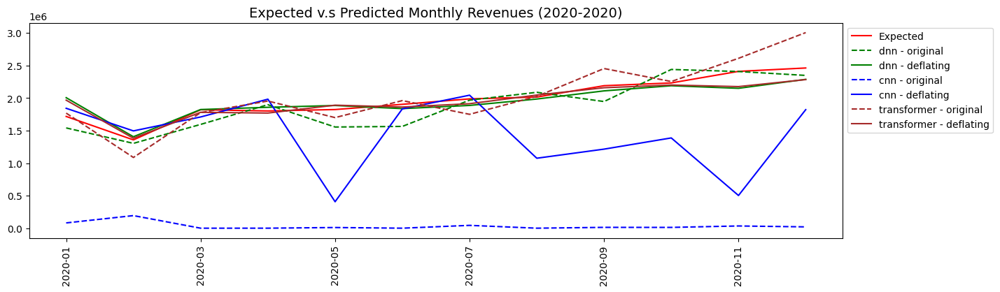

In [ ]:
plotExpectedPredictedRevenues(org_data, pred_dnn_loaded, pred_cnn_loaded, pred_transformer_loaded, start_y)

#### **5.1.2 分模型畫圖**

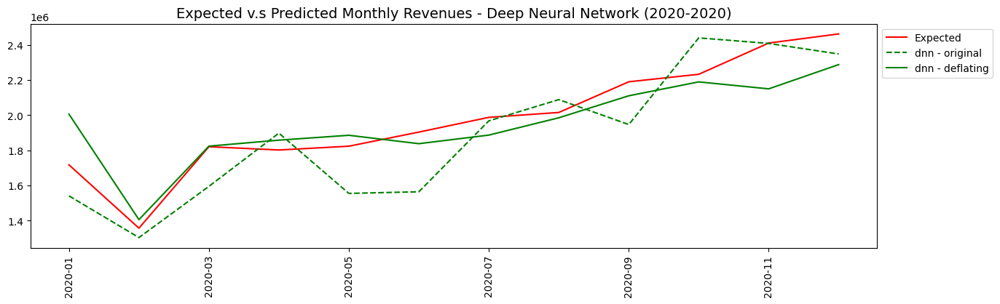

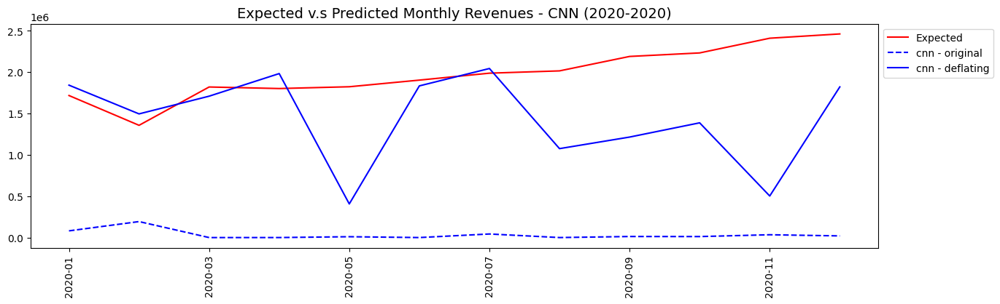

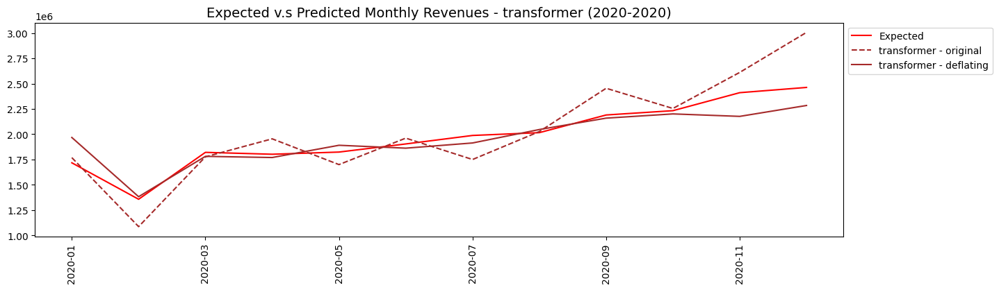

In [ ]:
plotModelExpectedPredictedRevenues(org_data, pred_dnn_loaded, 'dnn', start_y)
plotModelExpectedPredictedRevenues(org_data, pred_cnn_loaded, 'cnn', start_y)
plotModelExpectedPredictedRevenues(org_data, pred_transformer_loaded, 'transformer', start_y)

### **5.2 預測分數**

*   RMSE (Root Mean Square Error)

  $RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^n(\hat{y}_i - y_i)^2}$

<br>

*   MAE (Mean Absolute Error)

  $MAE = \frac{1}{n}\sum_{i=1}^n|\hat{y}_i - y_i|$


#### **5.2.1 All**

In [ ]:
# Read the dictionary from the file
# dnn
with open(file_path_scores_dnn, 'rb') as f:
    scores_dnn_loaded = pickle.load(f)

# cnn
with open(file_path_scores_cnn, 'rb') as f:
    scores_cnn_loaded = pickle.load(f)

# transformer
with open(file_path_scores_transformer, 'rb') as f:
    scores_transformer_loaded = pickle.load(f)

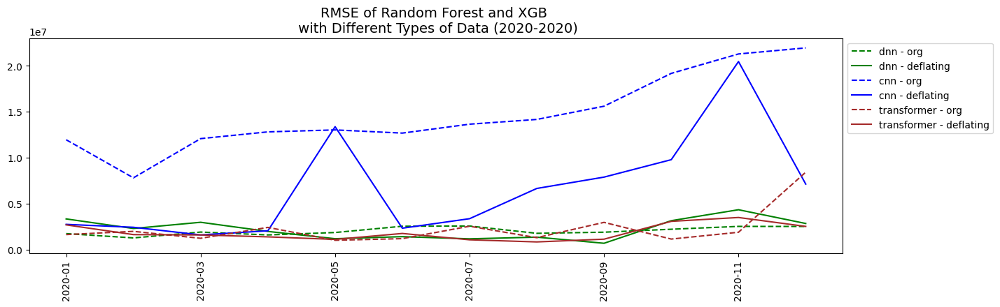

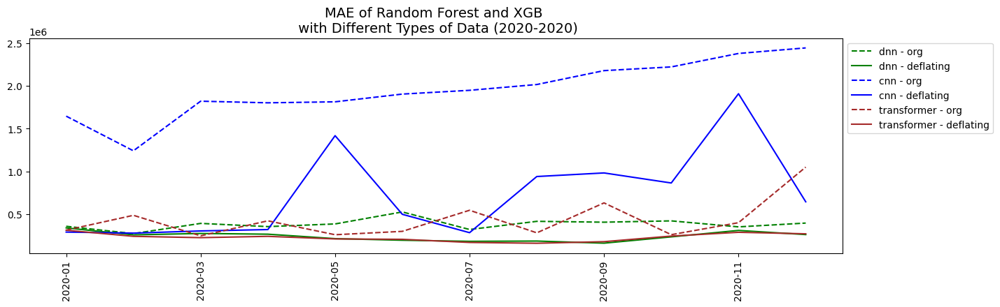

In [ ]:
# plotAllScores(scores_dnn, scores_cnn, scores_transformer, start_y)
plotAllScores(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded, start_y)

#### **5.2.2 分模型畫圖**

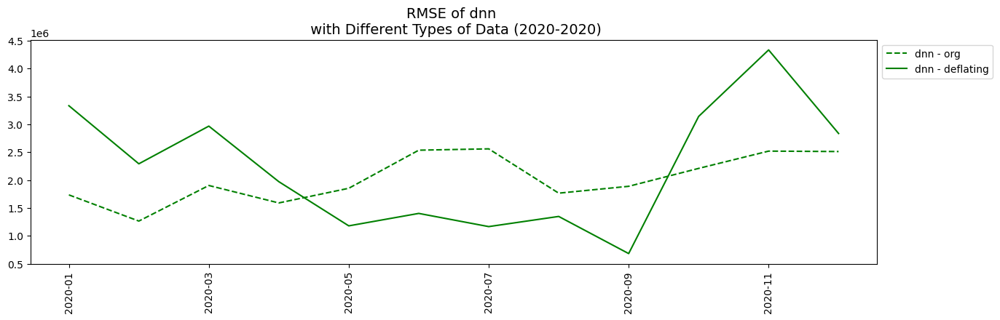

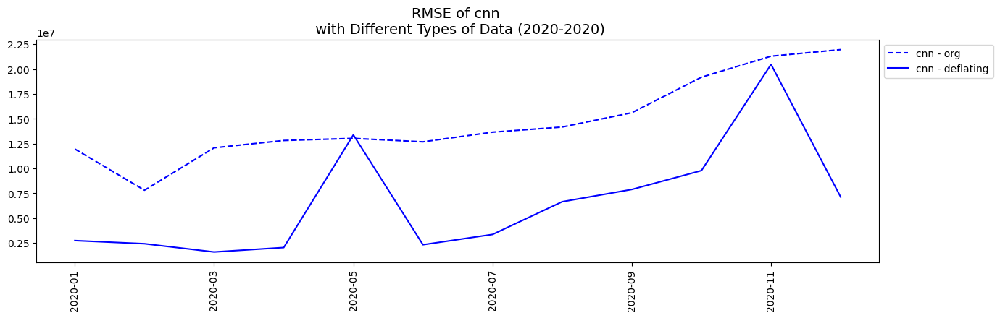

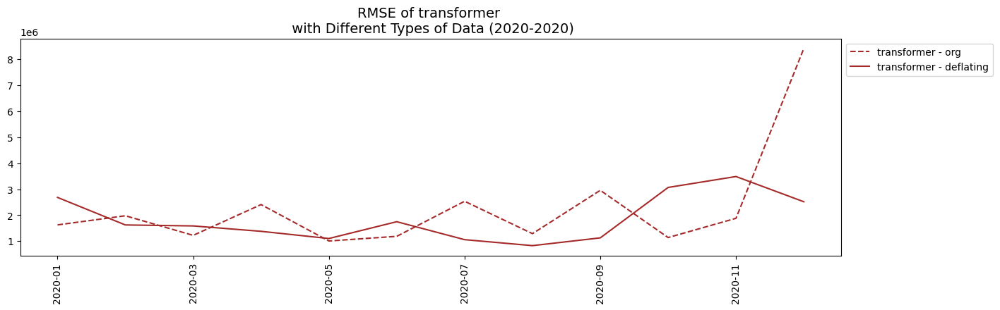

In [ ]:
# RMSE
# compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y) 
compareModelScore(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded, 'RMSE', start_y)  


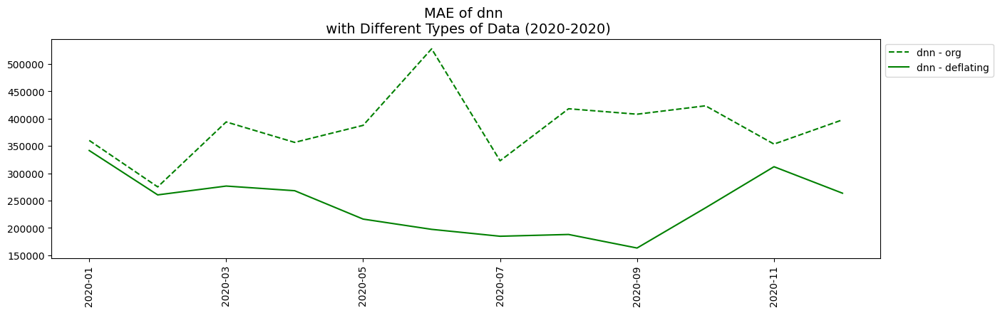

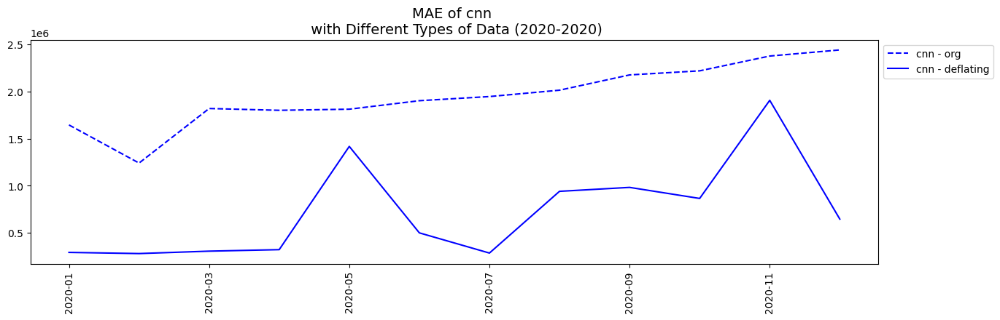

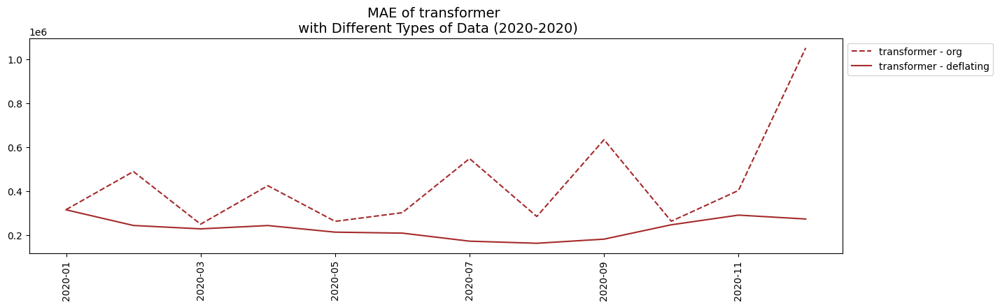

In [ ]:
# # MAE
# compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  
compareModelScore(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded, 'MAE', start_y)  

#### **5.2.3 Boxplot**

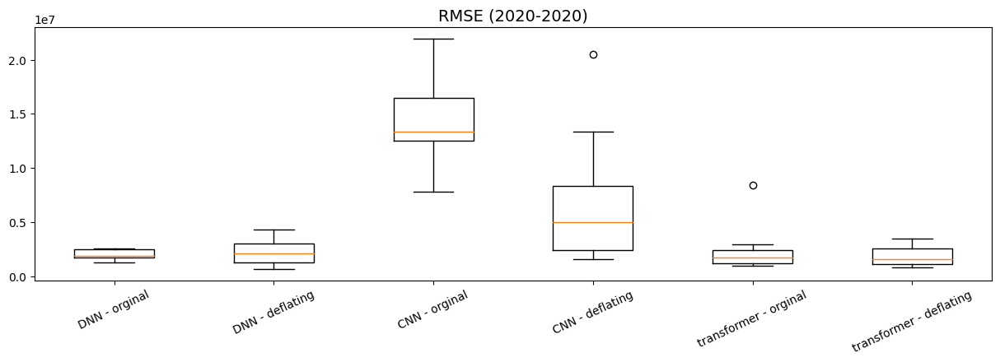

In [ ]:
# RMSE
# scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y)
scoreBoxplotV(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded, 'RMSE', start_y)    

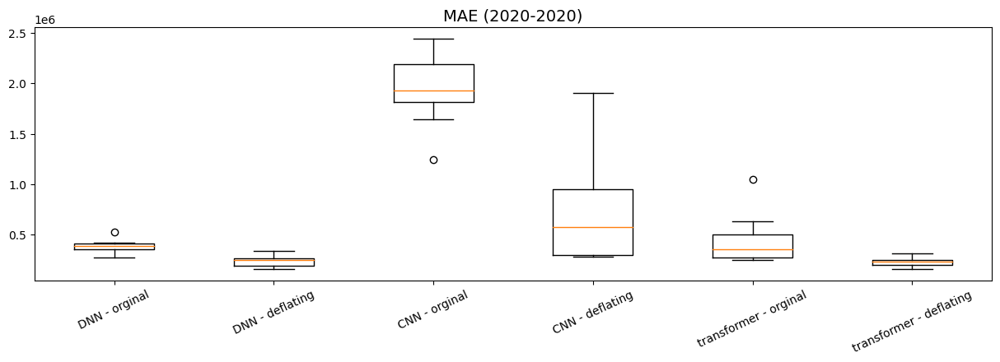

In [ ]:
# MAE
# scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  
scoreBoxplotV(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded, 'MAE', start_y)  

### **5.3 變數重要性**

In [ ]:
# Read the dictionary from the file
# dnn
with open(file_path_feature_importance_dnn, 'rb') as f:
    feature_importance_dnn_loaded = pickle.load(f)

# cnn
with open(file_path_feature_importance_cnn, 'rb') as f:
    feature_importance_cnn_loaded = pickle.load(f)

# transformer
with open(file_path_feature_importance_transformer, 'rb') as f:
    feature_importance_transformer_loaded = pickle.load(f)

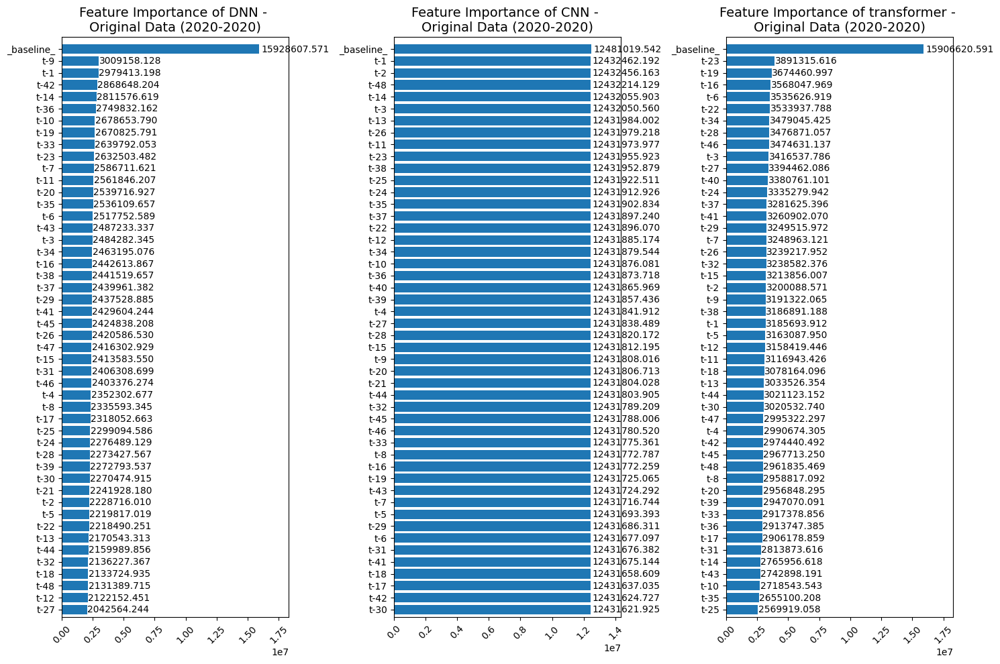

In [ ]:
# plotFeatureImportance(
#     feature_importance_dnn['org'],
#     feature_importance_cnn['org'], 
#     feature_importance_transformer['org'], 
#     'org', start_y, 48)

plotFeatureImportance(
    feature_importance_dnn_loaded['org'],
    feature_importance_cnn_loaded['org'], 
    feature_importance_transformer_loaded['org'], 
    'org', start_y, 48)

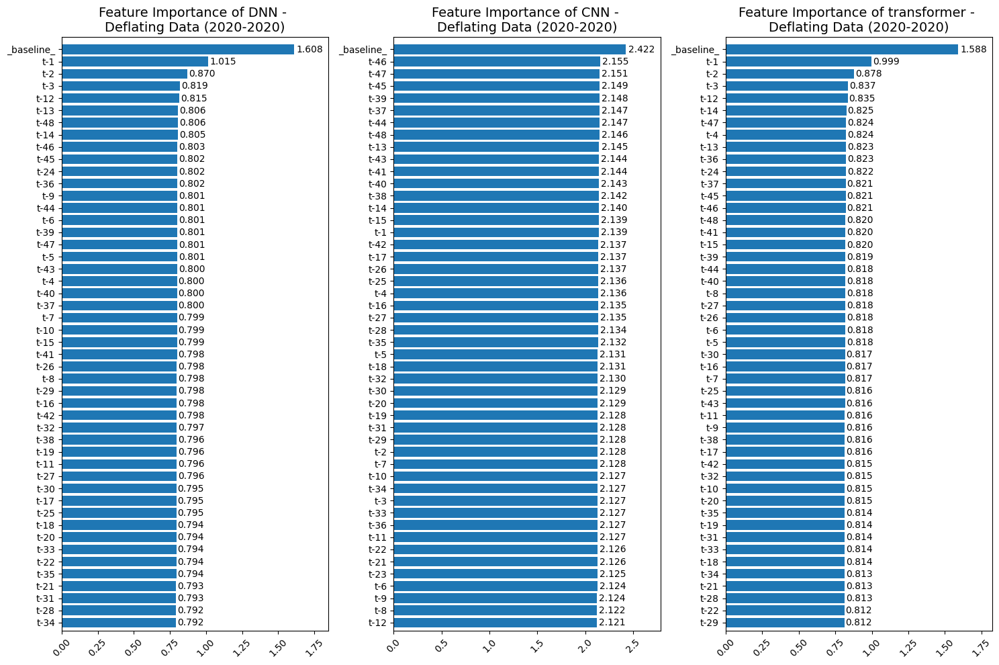

In [ ]:
plotFeatureImportance(
    feature_importance_dnn_loaded['def'], 
    feature_importance_cnn_loaded['def'], 
    feature_importance_transformer_loaded['def'], 
    'def', start_y, 48)

## **6. 最好和最差模型**

### **6.0 Classes**

In [ ]:
class BestWorstModel():
    '''
    找出最好和最差模型。

    Attributes
    ----------
    best_dnn, worst_dnn: dict
        DNN 在各個衡量指標下最好和最差的模型。
    best_cnn, worst_cnn: dict
        CNN 在各個衡量指標下最好和最差的模型。
    best_transformer, worst_transformer: dict
        transformer 在各個衡量指標下最好和最差的模型。
    best_all, worst_all: dict
        所有模型中，在各個衡量指標下最好和最差的模型。
    ----------
    best_worst_dnn, best_worst_cnn, best_worst_transformer: pd.DataFrame
        各資料處理方式中，預測最好和最差的月份。
    best_worst: pd.DataFrame
        各資料處理方式與模型組合中，預測最好和最差的月份。
    '''

    def __init__(self, score_dnn: pd.DataFrame, score_cnn: pd.DataFrame, score_transformer):
        self.score_dnn = score_dnn
        self.score_cnn = score_cnn
        self.score_transformer = score_transformer
        self.best_worst_dnn, self.best_worst_cnn, self.best_worst_transformer, self.best_worst = self.createBestWorstForAll()
        self.best_dnn, self.worst_dnn = self.findBestWorstByModel('dnn')
        self.best_cnn, self.worst_cnn = self.findBestWorstByModel('cnn')
        self.best_transformer, self.worst_transformer = self.findBestWorstByModel('transformer')
        self.best_all, self.worst_all = self.findBestWorstByModel('all')

    def createBestWorstForAll(self):
        '''
        各資料處理方式與模型組合中，預測最好和最差的月份。
        '''
        best_worst_dnn = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])
        best_worst_cnn = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])
        best_worst_transformer = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])

        # Random Forest
        for colName, colData in self.score_dnn.items():
            best_worst_dnn.loc[len(best_worst_dnn)] = ['dnn', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()]
        # XGB
        for colName, colData in self.score_cnn.items():
            best_worst_cnn.loc[len(best_worst_cnn)] = ['cnn', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()] 
        
        for colName, colData in self.score_transformer.items():
            best_worst_transformer.loc[len(best_worst_transformer)] = ['transformer', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()] 
       
        # All
        best_worst = pd.concat([best_worst_dnn, best_worst_cnn, best_worst_transformer])

        # Sort by scoreType
        best_worst_dnn.sort_values(by=['scoreType'])
        best_worst_cnn.sort_values(by=['scoreType'])
        best_worst_transformer.sort_values(by=['scoreType'])

        return best_worst_dnn, best_worst_cnn, best_worst_transformer, best_worst


    def findBestWorstByModel(self, modelName: str):
        '''
        根據所選擇的模型，找出不同衡量指標下預測最好和最差的月份。

        Parameters
        ----------
        modelName: | 'dnn' | 'cnn' | 'transforner' | 'all' |

        Returns
        ----------
        best_dict: {"RMSE", "MAE"}
        worst_dict: {"RMSE", "MAE"}
        '''

        if modelName == 'dnn':
            scoreD = self.best_worst_dnn.copy()
        elif modelName == 'cnn':
            scoreD = self.best_worst_cnn.copy()
        elif modelName == 'transformer':
            scoreD = self.best_worst_transformer.copy()
        elif modelName == 'all':
            scoreD = self.best_worst.copy()

        best_dict = {}
        worst_dict = {}

        scoreTypes = ['RMSE', 'MAE']
        for s in scoreTypes:
            scores = scoreD[scoreD['scoreType'] == s]   # filter
            best = scores[scores.min_score == scores.min_score.min()]
            best = best.drop(['max_month', 'max_score'], axis=1)
            best_dict[s] = best
            worst = scores[scores.max_score == scores.max_score.max()]
            worst = worst.drop(['min_month', 'min_score'], axis=1)
            worst_dict[s] = worst

        return best_dict, worst_dict


In [ ]:
class BestWorstModelFeatureImportancePlot():
    '''
    Parameters
    ----------
    feature_dnn, feature_cnn, feature_transformer: 各模型在各資料處理方式下的變數重要性。
    best_dnn, worst_dnn: DNN 在各個衡量指標下最好和最差的模型。
    best_cnn, worst_cnn: CNN 在各個衡量指標下最好和最差的模型。
    best_transformer, worst_transformer: CNN 在各個衡量指標下最好和最差的模型。
    test_year: 測試資料開始年份。

    Methods
    ----------
    plotBestWorstFeatureImportance(scoreType: str, k: int):
        scoreType: | 'RMSE' | 'MAE' |,
        k: Top k 重要變數 <= 10 (default = 5),
    '''

    def __init__(self, feature_dnn: pd.DataFrame, feature_cnn: pd.DataFrame, 
                 feature_transformer,
                 best_dnn: pd.DataFrame, worst_dnn: pd.DataFrame, 
                 best_cnn: pd.DataFrame, worst_cnn: pd.DataFrame, 
                 best_transformer: pd.DataFrame, worst_transformer: pd.DataFrame, 
                 best_all: pd.DataFrame, worst_all: pd.DataFrame, test_year: int):
        self.feature_dnn = feature_dnn
        self.feature_cnn = feature_cnn
        self.feature_transformer = feature_transformer
        self.best_dnn = best_dnn
        self.worst_dnn = worst_dnn
        self.best_cnn = best_cnn
        self.worst_cnn = worst_cnn
        self.best_transformer = best_transformer
        self.worst_transformer = worst_transformer
        self.best_all = best_all
        self.worst_all = worst_all
        self.test_year = test_year


    def plotSingleFeatureImportance(self, feature_importance: dict, modelName: str, dataType: str, month: str, best_or_worst: str, k: int):
        '''
        畫出 best 或 worst model 的 feature importance。
        '''
        # Data Type          
        if dataType == 'org':
            name = 'Original Data'
            key1 = 'org'
        elif dataType == 'def':
            name = 'Deflating Data'
            key1 = 'def'

        feature = feature_importance[key1][month]     # 最好 or 最差模型的 feature importance              
        feature = feature.sort_values()               # 由小到大做排序
        feature = feature.iloc[-k:, ]                 # Top k

        # Plot
        if self.test_year == 2018:
            plt.title(f"Feature Importance of {modelName} {best_or_worst} Model - \n{name} ({self.test_year}-2019)", size = 14)
        elif self.test_year == 2020:
            plt.title(f"Feature Importance of {modelName} {best_or_worst} Model - \n{name} ({self.test_year}-2022)", size = 14)

        plt.barh(y = feature.index, width = feature.values, data = feature)
        for a, b in zip(range(feature.shape[0]), feature.values):
            plt.text(b*1.01, a-0.1, '%.3f' % b)
        plt.xlim([0, max(feature)*1.15])
        plt.ylim([-0.65, feature.shape[0]])
        plt.xticks(rotation = 45)


    def plotModelBestWorstFeatureImportance(self, modelName: str, dataType: list, month: list, k: int):
        '''
        畫出不同模型最好和最差模型的 Top k 重要變數。

        Parameters
        ----------
        modelName: | 'dnn' | 'cnn' | 'transformer' ,
        dataType: [最佳模型的 data type, 最差模型的 data type],
        month: [最佳模型的月份, 最差模型的月份],
        k: Top k 重要變數 <= 10 (default = 5)
        '''

        # Model
        if modelName == "dnn":
            feature_importance = self.feature_dnn
        elif modelName == "cnn":
            feature_importance = self.feature_cnn
        elif modelName == "transformer":
            feature_importance = self.feature_transformer
        
        # Plot
        plt.figure(figsize=(15,3))
        # Model - Best
        plt.subplot(1,2,1)
        self.plotSingleFeatureImportance(feature_importance, modelName, dataType[0], month[0], "Best", k)
        # Model - Worst
        plt.subplot(1,2,2)
        self.plotSingleFeatureImportance(feature_importance, modelName, dataType[1], month[1], "Worst", k)
        plt.tight_layout()
        plt.show()


    def plotBestWorstFeatureImportance(self, scoreType: str, k: int = 5):
        '''
        畫出不同模型最好和最差模型的 Top k 重要變數。

        Parameters
        ----------
        scoreType: | 'RMSE' | 'MAE' |,
        k: Top k 重要變數 <= 10 (default = 5),
        '''

        if k > 10:
            print("Please select a number smaller than or equal to 10 for top k.") 
        else:
            dataName_dnn = [self.best_dnn[scoreType].iloc[0]['dataType'], self.worst_dnn[scoreType].iloc[0]['dataType']]
            dataName_cnn = [self.best_cnn[scoreType].iloc[0]['dataType'], self.worst_cnn[scoreType].iloc[0]['dataType']]
            dataName_transformer = [self.best_transformer[scoreType].iloc[0]['dataType'], self.worst_transformer[scoreType].iloc[0]['dataType']]
            month_dnn = [self.best_dnn[scoreType].iloc[0]['min_month'], self.worst_dnn[scoreType].iloc[0]['max_month']]
            month_cnn = [self.best_cnn[scoreType].iloc[0]['min_month'], self.worst_cnn[scoreType].iloc[0]['max_month']]           
            month_transformer = [self.best_transformer[scoreType].iloc[0]['min_month'], self.worst_transformer[scoreType].iloc[0]['max_month']]           
            # Random Forest
            self.plotModelBestWorstFeatureImportance('dnn', dataName_dnn, month_dnn, k)
            # XGB
            self.plotModelBestWorstFeatureImportance('cnn', dataName_cnn, month_cnn, k)
            self.plotModelBestWorstFeatureImportance('transformer', dataName_transformer, month_transformer, k)


### **6.1 DNN, CNN 和 Transformer 各自預測最好和最差的月份**

||modelType|dataType|scoreType|Best & Worst Month|Total|
|-|-|-|-|-|-|
|Numbers|2|1|2|2 (fixed)|2x1x2x2 = 8|

In [ ]:
bw = BestWorstModel(scores_dnn_loaded, scores_cnn_loaded, scores_transformer_loaded)

In [ ]:
imp_plot = BestWorstModelFeatureImportancePlot(
    feature_importance_dnn_loaded, feature_importance_cnn_loaded, feature_importance_transformer_loaded, 
    bw.best_dnn, bw.worst_dnn, 
    bw.best_cnn, bw.worst_cnn, 
    bw.best_transformer, bw.worst_transformer, 
    bw.best_all, bw.worst_all, start_y)
top_k = 5

#### **6.1.1 RMSE**

##### **最佳模型**

In [ ]:
# DNN
bw.best_dnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,dnn,def,RMSE,2020-09,680977.0


In [ ]:
# CNN
bw.best_cnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,cnn,def,RMSE,2020-03,1591284.0


In [ ]:
# Transformer
bw.best_transformer['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,transformer,def,RMSE,2020-08,827583.0


##### **最差模型**

In [ ]:
# DNN
bw.worst_dnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
2,dnn,def,RMSE,2020-11,4333622.0


In [ ]:
# CNN
bw.worst_cnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,cnn,org,RMSE,2020-12,21960777.0


In [ ]:
# Transformer
bw.worst_transformer['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,transformer,org,RMSE,2020-12,8421225.0


##### **Feature Importance**



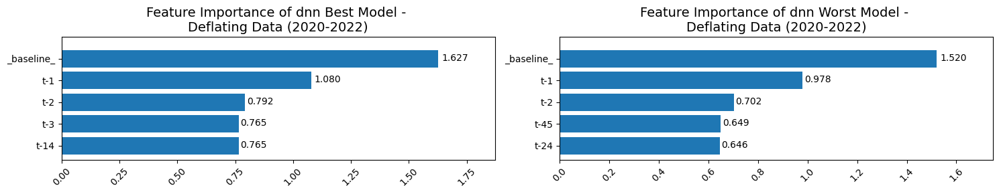

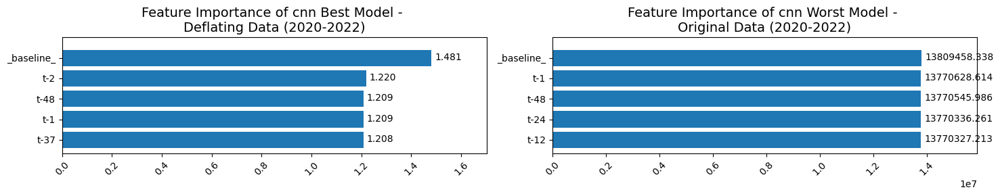

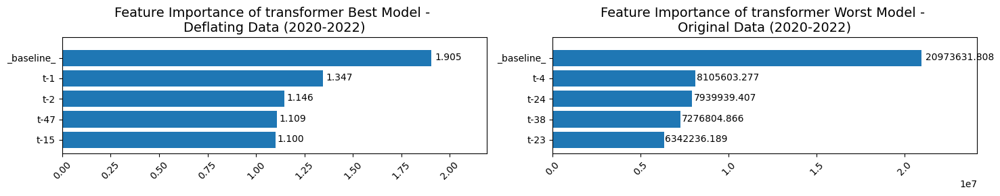

In [ ]:
imp_plot.plotBestWorstFeatureImportance('RMSE', top_k)

#### **6.1.2 MAE**

##### **最佳模型**

In [ ]:
# DNN
bw.best_dnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,dnn,def,MAE,2020-09,163233.0


In [ ]:
# CNN
bw.best_cnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,cnn,def,MAE,2020-02,280394.0


In [ ]:
# Transformer
bw.best_transformer['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,transformer,def,MAE,2020-08,162106.0


##### **最差模型**

In [ ]:
# DNN
bw.worst_dnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,dnn,org,MAE,2020-06,527774.0


In [ ]:
# CNN
bw.worst_cnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,cnn,org,MAE,2020-12,2442582.0


In [ ]:
# Transformer
bw.worst_transformer['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,transformer,org,MAE,2020-12,1050891.0


##### **Feature Importance**



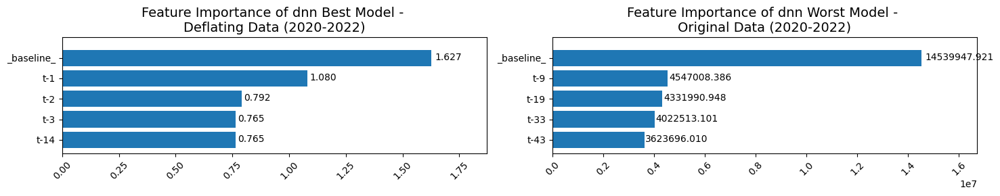

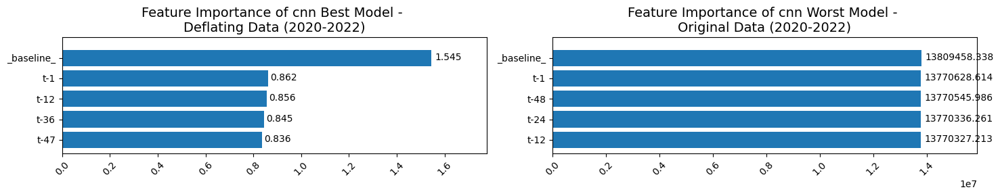

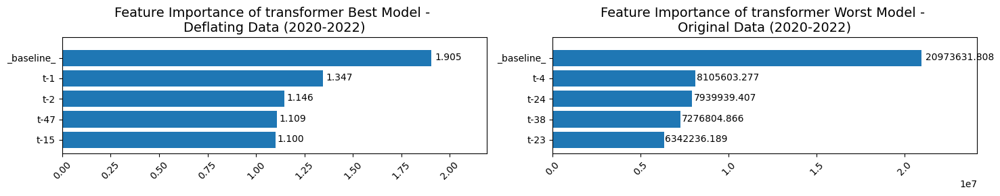

In [ ]:
imp_plot.plotBestWorstFeatureImportance('MAE', top_k)

# 第二部分：鎖定產業進行預測 
(程式分批、分檔案執行，所以此檔案無保留這個區段的輸出結果)


自行挑選一個產業，討論其月營收預測的結果。產業範圍可以自行決定，預測時間同第一部分，為 2020/1 ~ 2020/12
- 請嘗試用程式碼進行產業篩選，不接受自行建立 excel 檔
- 決定資料是否平減也是你實驗設計的一環

### 讀取 TSE 資料

In [ ]:
project_path = '/content/gdrive/MyDrive/Colab Notebooks/MLAcc/HW4/HW4'
industry = pd.read_excel(os.path.join(project_path, 'TSE industry.xlsx'))
display(industry)

,公司簡稱,TSE 產業別,TSE新產業_名稱
0,1101 台泥,1,水泥工業
1,1102 亞泥,1,水泥工業
2,1103 嘉泥,1,水泥工業
3,1104 環泥,1,水泥工業
4,1108 幸福,1,水泥工業
...,...,...,...
1783,9949 琉園,32,文化創意業
1784,9950 萬國通,3,塑膠工業
1785,9951 皇田,5,電機機械
1786,9960 邁達康,18,貿易百貨


### 選定半導體產業作為分析標的


In [ ]:
# 複製資料 (org_data 為去除排除金融業、生技醫療、建材營造、DR和KY公司後的原始資料)
org_data_semi = org_data.copy()

# 刪除所有非「半導體」的產業
company_list = industry[(industry['TSE新產業_名稱'] != '半導體')]['公司簡稱'].tolist()
company_filter = org_data_semi.index.isin(company_list)
org_data_semi = org_data_semi.loc[~company_filter,:]

In [ ]:
# 確認資料欄位
print("Data shape:", org_data_semi.shape)
print("Data size:", org_data_semi.size)

Data shape: (129, 120)
Data size: 15480


### 預測年月設定

||訓練資料X|訓練資料y|測試資料X|測試資料y|
|---|---|---|---|---|
|Start|2015-01 - 2018-12|2019-01|2016-01 - 2019-12|**2020-01**|
|End|2015-12 - 2019-11|2019-12|2016-12 - 2020-11|**2020-12**|

In [ ]:
start_y = 2020
start_m = 1
end_y = 2020
end_m = 12

### **DNN**

In [ ]:
# # 訓練與預測 (12 min.)

# pred_dnn, feature_importance_dnn, scores_dnn = predictMonthlyRevenue(
#     org_data_semi, start_y, start_m, end_y, end_m, 'dnn', make_dnn_model, 1e-4
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_dnn_semi = os.path.join(project_path, 'pred_dnn_semi.pkl')
# with open(file_path_pred_dnn_semi, 'wb') as f:
#     pickle.dump(pred_dnn_semi, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_dnn_semi = os.path.join(project_path, 'feature_importance_dnn_semi.pkl')
# with open(file_path_feature_importance_dnn_semi, 'wb') as f:
#     pickle.dump(feature_importance_dnn_semi, f)

# # Write the dictionary to a file_scores
# file_path_scores_dnn_semi = os.path.join(project_path, 'scores_dnn_semi.pkl')
# with open(file_path_scores_dnn_semi, 'wb') as f:
#     pickle.dump(scores_dnn_semi, f)

In [ ]:
# # 下載 2020 DNN logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

### **CNN**

In [ ]:
# pred_cnn, feature_importance_cnn, scores_cnn = predictMonthlyRevenue(
#     org_data_semi, start_y, start_m, end_y, end_m, 'cnn', make_cnn_model, 5e-2
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_cnn_semi = os.path.join(project_path, 'pred_cnn_semi.pkl')
# with open(file_path_pred_cnn_semi, 'wb') as f:
#     pickle.dump(pred_cnn_semi, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_cnn_semi = os.path.join(project_path, 'feature_importance_cnn_semi.pkl')
# with open(file_path_feature_importance_cnn_semi, 'wb') as f:
#     pickle.dump(feature_importance_cnn_semi, f)

# # Write the dictionary to a file_scores
# file_path_scores_cnn_semi = os.path.join(project_path, 'scores_cnn_semi.pkl')
# with open(file_path_scores_cnn_semi, 'wb') as f:
#     pickle.dump(scores_cnn_semi, f)

In [ ]:
# # 下載 2020 DNN logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

### **Transformer**

In [ ]:
# pred_transformer, feature_importance_transformer, scores_transformer = predictMonthlyRevenue(
#     org_data_semi, start_y, start_m, end_y, end_m, 'transformer', make_transformer_model, 1e-4
# )

In [ ]:
# import pickle

# # Write the dictionary to a file_pred
# file_path_pred_transformer_semi = os.path.join(project_path, 'pred_transformer_semi.pkl')
# with open(file_path_pred_transformer_semi, 'wb') as f:
#     pickle.dump(pred_transformer_semi, f)

# # Write the dictionary to a file_feature importance
# file_path_feature_importance_transformer_semi = os.path.join(project_path, 'feature_importance_transformer_semi.pkl')
# with open(file_path_feature_importance_transformer_semi, 'wb') as f:
#     pickle.dump(feature_importance_transformer_semi, f)

# # Write the dictionary to a file_scores
# file_path_scores_transformer_semi = os.path.join(project_path, 'scores_transformer_semi.pkl')
# with open(file_path_scores_transformer_semi, 'wb') as f:
#     pickle.dump(scores_transformer_semi, f)

In [ ]:
# # 下載 2020 DNN logs 資料夾
# import shutil

# # 指定要下載的資料夾路徑
# logs_folder_path = "/content/logs"

# # 壓縮資料夾
# shutil.make_archive("/content/logs", "zip", logs_folder_path)

# # 下載壓縮檔
# from google.colab import files
# files.download("/content/logs.zip")

### 畫圖

#### 預測金額


In [ ]:
# # file path
# import pickle

# # dnn
# file_path_pred_dnn_semi = os.path.join(project_path, 'pred_dnn_semi.pkl')
# file_path_feature_importance_dnn_semi = os.path.join(project_path, 'feature_importance_dnn_semi.pkl')
# file_path_scores_dnn_semi = os.path.join(project_path, 'scores_dnn_semi.pkl')

# # cnn
# file_path_pred_cnn_semi = os.path.join(project_path, 'pred_cnn_semi.pkl')
# file_path_feature_importance_cnn_semi = os.path.join(project_path, 'feature_importance_cnn_semi.pkl')
# file_path_scores_cnn_semi = os.path.join(project_path, 'scores_cnn_semi.pkl')

# # transformer
# file_path_pred_transformer_semi = os.path.join(project_path, 'pred_transformer_semi.pkl')
# file_path_feature_importance_transformer_semi = os.path.join(project_path, 'feature_importance_transformer_semi.pkl')
# file_path_scores_transformer_semi = os.path.join(project_path, 'scores_transformer_semi.pkl')

In [ ]:
# # Read the dictionary from the file

# # dnn
# with open(file_path_pred_dnn_semi, 'rb') as f:
#     pred_dnn_loaded_semi = pickle.load(f)

# # cnn
# with open(file_path_pred_cnn_semi, 'rb') as f:
#     pred_cnn_loaded_semi = pickle.load(f)

# # transformer
# with open(file_path_pred_transformer_semi, 'rb') as f:
#     pred_transformer_loaded_semi = pickle.load(f)


##### ALL


In [ ]:
# plotExpectedPredictedRevenues(org_data_semi, pred_dnn_loaded_semi, pred_cnn_loaded_semi, pred_transformer_loaded_semi, start_y)

##### 分模型畫圖


In [ ]:
# plotModelExpectedPredictedRevenues(org_data_semi, pred_dnn_loaded_semi, 'dnn', start_y)
# plotModelExpectedPredictedRevenues(org_data_semi, pred_cnn_loaded_semi, 'cnn', start_y)
# plotModelExpectedPredictedRevenues(org_data_semi, pred_transformer_loaded_semi, 'transformer', start_y)

#### 預測分數
*   RMSE (Root Mean Square Error)

  $RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^n(\hat{y}_i - y_i)^2}$

<br>

*   MAE (Mean Absolute Error)

  $MAE = \frac{1}{n}\sum_{i=1}^n|\hat{y}_i - y_i|$


##### ALL

In [ ]:
# # Read the dictionary from the file
# # dnn
# with open(file_path_scores_dnn_semi, 'rb') as f:
#     scores_dnn_loaded_semi = pickle.load(f)

# # cnn
# with open(file_path_scores_cnn_semi, 'rb') as f:
#     scores_cnn_loaded_semi = pickle.load(f)

# # transformer
# with open(file_path_scores_transformer_semi, 'rb') as f:
#     scores_transformer_loaded_semi = pickle.load(f)

In [ ]:
# # plotAllScores(scores_dnn, scores_cnn, scores_transformer, start_y)
# plotAllScores(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi, start_y)

##### 分模型畫圖

In [ ]:
# # RMSE
# # compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y) 
# compareModelScore(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi, 'RMSE', start_y)  


In [ ]:
# # # MAE
# # compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  
# compareModelScore(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi, 'MAE', start_y)  

##### Boxplot

In [ ]:
# # RMSE
# # scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y)
# scoreBoxplotV(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi, 'RMSE', start_y)    

In [ ]:
# # MAE
# # scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  
# scoreBoxplotV(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi, 'MAE', start_y)  

#### 變數重要性

In [ ]:
# # Read the dictionary from the file
# # dnn
# with open(file_path_feature_importance_dnn_semi, 'rb') as f:
#     feature_importance_dnn_loaded_semi = pickle.load(f)

# # cnn
# with open(file_path_feature_importance_cnn_semi, 'rb') as f:
#     feature_importance_cnn_loaded_semi = pickle.load(f)

# # transformer
# with open(file_path_feature_importance_transformer_semi, 'rb') as f:
#     feature_importance_transformer_loaded_semi = pickle.load(f)

In [ ]:
# # plotFeatureImportance(
# #     feature_importance_dnn['org'],
# #     feature_importance_cnn['org'], 
# #     feature_importance_transformer['org'], 
# #     'org', start_y, 48)

# plotFeatureImportance(
#     feature_importance_dnn_loaded_semi['org'],
#     feature_importance_cnn_loaded_semi['org'], 
#     feature_importance_transformer_loaded_semi['org'], 
#     'org', start_y, 48)

In [ ]:
# plotFeatureImportance(
#     feature_importance_dnn_loaded_semi['def'], 
#     feature_importance_cnn_loaded_semi['def'], 
#     feature_importance_transformer_loaded_semi['def'], 
#     'def', start_y, 48)

### 最好和最差模型

#### DNN, CNN 和 Transformer 各自預測最好和最差的月份

||modelType|dataType|scoreType|Best & Worst Month|Total|
|-|-|-|-|-|-|
|Numbers|2|1|2|2 (fixed)|2x1x2x2 = 8|

In [ ]:
# bw = BestWorstModel(scores_dnn_loaded_semi, scores_cnn_loaded_semi, scores_transformer_loaded_semi)

In [ ]:
# imp_plot = BestWorstModelFeatureImportancePlot(
#     feature_importance_dnn_loaded_semi, feature_importance_cnn_loaded_semi, feature_importance_transformer_loaded_semi, 
#     bw.best_dnn, bw.worst_dnn, 
#     bw.best_cnn, bw.worst_cbw.best_dnnnn, 
#     bw.best_transformer, bw.worst_transformer, 
#     bw.best_all, bw.worst_all, start_y)
# top_k = 5

##### RMSE

###### 最佳模型

In [ ]:
# # DNN
# bw.best_dnn['RMSE']

In [ ]:
# # CNN
# bw.best_cnn['RMSE']

In [ ]:
# # Transformer
# bw.best_transformer['RMSE']

###### 最差模型


In [ ]:
# # DNN
# bw.worst_dnn['RMSE']

In [ ]:
# # CNN
# bw.worst_cnn['RMSE']

In [ ]:
# # Transformer
# bw.worst_transformer['RMSE']

###### Feature Importance

In [ ]:
# imp_plot.plotBestWorstFeatureImportance('RMSE', top_k)

##### MAE

###### 最佳模型

In [ ]:
# # DNN
# bw.best_dnn['MAE']

In [ ]:
# # CNN
# bw.best_cnn['MAE']

In [ ]:
# # Transformer
# bw.best_transformer['MAE']

###### 最差模型

In [ ]:
# # DNN
# bw.worst_dnn['MAE']

In [ ]:
# # CNN
# bw.worst_cnn['MAE']

In [ ]:
# # Transformer
# bw.worst_transformer['MAE']

###### Feature Importance

In [ ]:
# imp_plot.plotBestWorstFeatureImportance('MAE', top_k)

-------------------------------------------------------------------------

# HW4
## 第一部分：比較不同模型在不同時段的預測結果
使用 DNN/CNN/Transformer 預測 2020/1 ~ 2022/12 （共 36 個月）的月營收，並與 2018/1 ~ 2019/12 的做比較，並詳述如何設定實驗、其中你的考量分別是什麼，例如：要不要平減、特徵長度選擇、訓練資料範圍選擇。此外，請：
1. 以折線圖呈現預期金額和各模型的預測金額
2. 分析預測結果，如討論各個模型分數差異、預測月營收的型態、最佳與最差模型（圖表請府以文字簡單說明結果）。
3. 與範例中 2018/1 ~ 2019/12 的預測結果做比較，並與 Random Forest 和 XGBoost Regression 做比較。  
注意：請盡量多探索不同設定（如：資料是否平減、不同模型結構、超參數設定等）、分析不同面向（如：運算時間、模型大小、overfitting 風險等），並輔以財務專業知識推測可能的原因（如：預測特別不準的地方可能發生了什麼事件）。呈現時請盡量選擇組織化的敘述方式，方便理解你想傳遞的結果。  
此外，深度模型的訓練超參數對表現影響頗大，如果模型訓練不理想，請多嘗試調整超參數甚至是模型結構。
    
## 第二部分：鎖定產業進行預測
自行挑選一個產業，討論其月營收預測的結果。產業範圍可以自行決定，預測時間同第一部分，為 2020/1 ~ 2022/12
- 請嘗試用程式碼進行產業篩選，不接受自行建立 excel 檔
- 決定資料是否平減也是你實驗設計的一環